In [1]:
# to download osm dataimport osmnx as ox
import osmnx as ox

# to manipulate and visualize spatial dataimport geopandas as gpd
import geopandas as gpd

# to provide basemaps import contextily as ctx
import contextily as ctx

# to plot things with plotlyimport plotly.express as px
import plotly.express as px

# we import this so we can process this csv file
import pandas as pd

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [2]:
# to import data from LA Data portal
from sodapy import Socrata

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

In [3]:
basement = pd.read_csv('data/Illegal_Basements.csv')

In [4]:
basement.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9918 entries, 0 to 9917
Data columns (total 31 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ViolationID            9918 non-null   int64  
 1   BuildingID             9918 non-null   int64  
 2   RegistrationID         9918 non-null   int64  
 3   BoroID                 9918 non-null   int64  
 4   Borough                9918 non-null   object 
 5   HouseNumber            9918 non-null   object 
 6   StreetName             9918 non-null   object 
 7   StreetCode             9918 non-null   int64  
 8   Postcode               9905 non-null   float64
 9   City                   9904 non-null   object 
 10  State                  9918 non-null   object 
 11  Address                9904 non-null   object 
 12  Apartment              2436 non-null   object 
 13  Story                  7196 non-null   object 
 14  Block                  9918 non-null   int64  
 15  Lot 

In [5]:
basement['Address']

0       61 LUDLOW STREET, STATEN ISLAND, NY 10312
1        1434 FLATBUSH AVENUE, BROOKLYN, NY 11210
2       116-28 194 STREET, SAINT ALBANS, NY 11412
3          448 BEACH 64 STREET, ARVERNE, NY 11692
4         409 ST LAWRENCE AVENUE, BRONX, NY 10473
                          ...                    
9913       969 HEGEMAN AVENUE, BROOKLYN, NY 11208
9914        2305 BATHGATE AVENUE, BRONX, NY 10458
9915         60-12 136 STREET, FLUSHING, NY 11355
9916        2305 BATHGATE AVENUE, BRONX, NY 10458
9917        2305 BATHGATE AVENUE, BRONX, NY 10458
Name: Address, Length: 9918, dtype: object

In [6]:
list(basement)

['ViolationID',
 'BuildingID',
 'RegistrationID',
 'BoroID',
 'Borough',
 'HouseNumber',
 'StreetName',
 'StreetCode',
 'Postcode',
 'City',
 'State',
 'Address',
 'Apartment',
 'Story',
 'Block',
 'Lot',
 'Class',
 'InspectionDate',
 'ApprovedDate',
 'OriginalCertifyByDate',
 'OriginalCorrectByDate',
 'NewCertifyByDate',
 'NewCorrectByDate',
 'CertifiedDate',
 'OrderNumber',
 'NOVID',
 'NOVDescription',
 'NOVIssuedDate',
 'CurrentStatusID',
 'CurrentStatus',
 'CurrentStatusDate']

In [7]:
basement_keep = ['ViolationID',
 'BuildingID',
 'RegistrationID',
 'BoroID',
 'Borough',
 'City',
 'State',
 'Address',
 'Story',
 'Block',
 'Lot']

In [8]:
basement = basement[basement_keep]

In [9]:
list(basement)

['ViolationID',
 'BuildingID',
 'RegistrationID',
 'BoroID',
 'Borough',
 'City',
 'State',
 'Address',
 'Story',
 'Block',
 'Lot']

In [10]:
basement['lat'] = pd.Series(dtype='float')
basement['lon'] = pd.Series(dtype='float')

In [11]:
basement.head()

,ViolationID,BuildingID,RegistrationID,BoroID,Borough,City,State,Address,Story,Block,Lot,lat,lon
0,10033903,757006,0,5,STATEN ISLAND,Staten Island,NY,"61 LUDLOW STREET, STATEN ISLAND, NY 10312",Cellar,5665,12,NaN,NaN
1,10395188,292273,820243,3,BROOKLYN,Brooklyn,NY,"1434 FLATBUSH AVENUE, BROOKLYN, NY 11210",Cellar,5249,46,NaN,NaN
2,10427618,586905,0,4,QUEENS,Saint Albans,NY,"116-28 194 STREET, SAINT ALBANS, NY 11412",Cellar,11064,74,NaN,NaN
3,10778222,632991,922822,4,QUEENS,Arverne,NY,"448 BEACH 64 STREET, ARVERNE, NY 11692",Basement,16037,29,NaN,NaN
4,11031926,110779,714099,2,BRONX,Bronx,NY,"409 ST LAWRENCE AVENUE, BRONX, NY 10473",Cellar,3493,72,NaN,NaN


In [12]:
# loop through list and add to dataframe with lat/lon's
for index, row in basement.iterrows():

    # identify the address column
    address = row['Address']
    
    try:
        
        # geocode it
        geocoded_address = ox.geocoder.geocode(address)

        # add it to the dataframe
        basement.at[index,'lat']=geocoded_address[0]
        basement.at[index,'lon']=geocoded_address[1]

        # print the output
        print(address + ' geocoded to ' + str(geocoded_address[0])+' '+str(geocoded_address[1]))        

    except:
        print('Could not geocode '+ address)
        pass

61 LUDLOW STREET, STATEN ISLAND, NY 10312 geocoded to 40.5525016 -74.1790963550473
1434 FLATBUSH AVENUE, BROOKLYN, NY 11210 geocoded to 40.63563395 -73.95099881676724
Could not geocode 116-28 194 STREET, SAINT ALBANS, NY 11412
Could not geocode 448 BEACH 64 STREET, ARVERNE, NY 11692
409 ST LAWRENCE AVENUE, BRONX, NY 10473 geocoded to 40.81304455 -73.86319664692894
414A KOSCIUSZKO STREET, BROOKLYN, NY 11221 geocoded to 40.692025099999995 -73.93769925457713
9508 FOSTER AVENUE, BROOKLYN, NY 11236 geocoded to 40.647184100000004 -73.90704791976484
9508 FOSTER AVENUE, BROOKLYN, NY 11236 geocoded to 40.647184100000004 -73.90704791976484
2297 CROTONA AVENUE, BRONX, NY 10458 geocoded to 40.8521418 -73.8848418
Could not geocode 663 EAST 220 STREET, BRONX, NY 10467
235 SUMPTER STREET, BROOKLYN, NY 11233 geocoded to 40.680636199999995 -73.91592664419537
467 JEROME STREET, BROOKLYN, NY 11207 geocoded to 40.67025925 -73.8857385
467 JEROME STREET, BROOKLYN, NY 11207 geocoded to 40.67025925 -73.885738

TypeError: can only concatenate str (not "float") to str

In [13]:
geocoded = basement[basement.lat.notnull()]

In [14]:
geocoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 416 entries, 0 to 780
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   ViolationID     416 non-null    int64  
 1   BuildingID      416 non-null    int64  
 2   RegistrationID  416 non-null    int64  
 3   BoroID          416 non-null    int64  
 4   Borough         416 non-null    object 
 5   City            415 non-null    object 
 6   State           416 non-null    object 
 7   Address         415 non-null    object 
 8   Story           376 non-null    object 
 9   Block           416 non-null    int64  
 10  Lot             416 non-null    int64  
 11  lat             416 non-null    float64
 12  lon             416 non-null    float64
dtypes: float64(2), int64(6), object(5)
memory usage: 45.5+ KB


In [15]:
# convert pandas dataframe to geodataframe
geocoded = gpd.GeoDataFrame(geocoded, 
                                     crs="EPSG:4326",
                                     geometry=gpd.points_from_xy(geocoded.lon, geocoded.lat))

In [16]:
geocoded.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 416 entries, 0 to 780
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   ViolationID     416 non-null    int64   
 1   BuildingID      416 non-null    int64   
 2   RegistrationID  416 non-null    int64   
 3   BoroID          416 non-null    int64   
 4   Borough         416 non-null    object  
 5   City            415 non-null    object  
 6   State           416 non-null    object  
 7   Address         415 non-null    object  
 8   Story           376 non-null    object  
 9   Block           416 non-null    int64   
 10  Lot             416 non-null    int64   
 11  lat             416 non-null    float64 
 12  lon             416 non-null    float64 
 13  geometry        416 non-null    geometry
dtypes: float64(2), geometry(1), int64(6), object(5)
memory usage: 48.8+ KB


In [17]:
# reproject to web mercator
geocoded = geocoded.to_crs(epsg=3857)

In [18]:
geocoded2 = geocoded[geocoded['lat'] > 40]

In [19]:
geocoded2.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 415 entries, 0 to 779
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   ViolationID     415 non-null    int64   
 1   BuildingID      415 non-null    int64   
 2   RegistrationID  415 non-null    int64   
 3   BoroID          415 non-null    int64   
 4   Borough         415 non-null    object  
 5   City            415 non-null    object  
 6   State           415 non-null    object  
 7   Address         415 non-null    object  
 8   Story           375 non-null    object  
 9   Block           415 non-null    int64   
 10  Lot             415 non-null    int64   
 11  lat             415 non-null    float64 
 12  lon             415 non-null    float64 
 13  geometry        415 non-null    geometry
dtypes: float64(2), geometry(1), int64(6), object(5)
memory usage: 48.6+ KB


In [20]:
geocoded.sample(5)

,ViolationID,BuildingID,RegistrationID,BoroID,Borough,City,State,Address,Story,Block,Lot,lat,lon,geometry
159,7836083,126359,714166,2,BRONX,Bronx,NY,"1719 ZEREGA AVENUE, BRONX, NY 10462",Cellar,3991,61,40.840158,-73.851904,POINT (-8221156.396 4988793.524)
617,10316611,300806,812083,3,BROOKLYN,Brooklyn,NY,"458 GLENMORE AVENUE, BROOKLYN, NY 11207",Basement,3723,18,40.673354,-73.893520,POINT (-8225789.009 4964280.210)
556,10242904,214864,0,3,BROOKLYN,Brooklyn,NY,"580 BROOKLYN AVENUE, BROOKLYN, NY 11203",Basement,4802,29,40.660132,-73.945586,POINT (-8231585.008 4962339.702)
133,4725554,186702,0,3,BROOKLYN,Brooklyn,NY,"211 AUTUMN AVENUE, BROOKLYN, NY 11208",NaN,4133,16,40.685153,-73.870295,POINT (-8223203.675 4966012.173)
166,8649942,356878,821194,3,BROOKLYN,Brooklyn,NY,"1679 PROSPECT PLACE, BROOKLYN, NY 11233",Cellar,1457,81,40.672895,-73.920762,POINT (-8228821.629 4964212.767)


In [21]:
geocoded2.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 415 entries, 0 to 779
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   ViolationID     415 non-null    int64   
 1   BuildingID      415 non-null    int64   
 2   RegistrationID  415 non-null    int64   
 3   BoroID          415 non-null    int64   
 4   Borough         415 non-null    object  
 5   City            415 non-null    object  
 6   State           415 non-null    object  
 7   Address         415 non-null    object  
 8   Story           375 non-null    object  
 9   Block           415 non-null    int64   
 10  Lot             415 non-null    int64   
 11  lat             415 non-null    float64 
 12  lon             415 non-null    float64 
 13  geometry        415 non-null    geometry
dtypes: float64(2), geometry(1), int64(6), object(5)
memory usage: 48.6+ KB


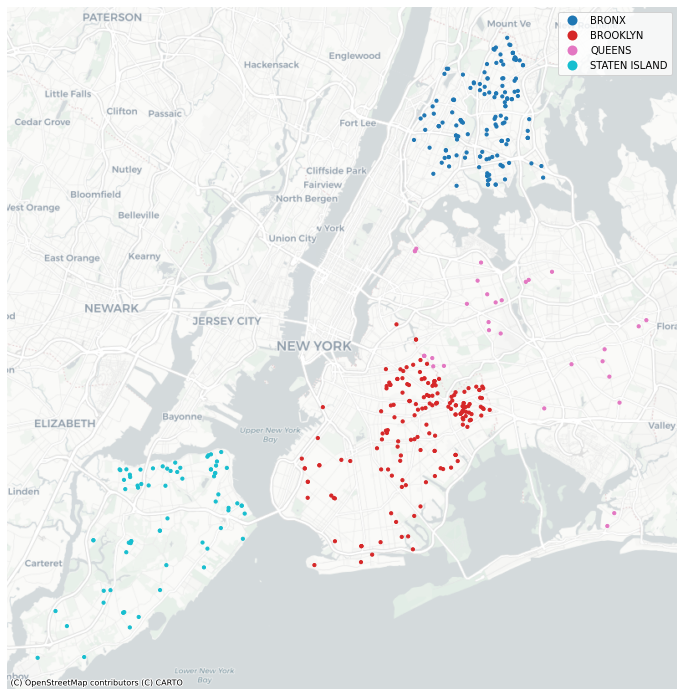

In [22]:
ax = geocoded2.plot(figsize=(12,20),
                              column='Borough',
                              legend=True,
                             markersize=10)

ax.axis('off')
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

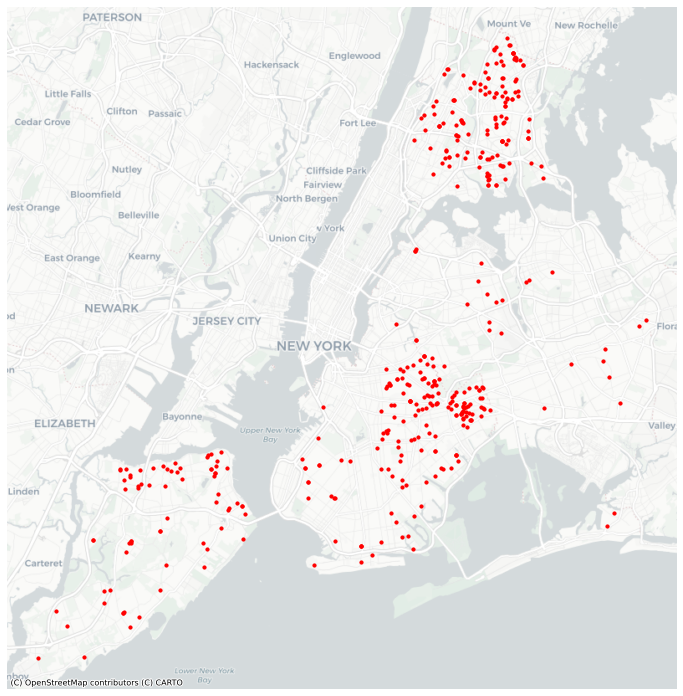

In [23]:
fig,ax = plt.subplots(figsize=(12,20))

geocoded2.plot(ax=ax,
             color='red',
             markersize=10)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [71]:
geocoded2.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 415 entries, 0 to 779
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   ViolationID     415 non-null    int64   
 1   BuildingID      415 non-null    int64   
 2   RegistrationID  415 non-null    int64   
 3   BoroID          415 non-null    int64   
 4   Borough         415 non-null    object  
 5   City            415 non-null    object  
 6   State           415 non-null    object  
 7   Address         415 non-null    object  
 8   Story           375 non-null    object  
 9   Block           415 non-null    int64   
 10  Lot             415 non-null    int64   
 11  lat             415 non-null    float64 
 12  lon             415 non-null    float64 
 13  geometry        415 non-null    geometry
dtypes: float64(2), geometry(1), int64(6), object(5)
memory usage: 48.6+ KB


In [25]:
flood = gpd.read_file('data/100 year Floodplain.geojson')

In [26]:
flood = flood.to_crs(epsg=3857)

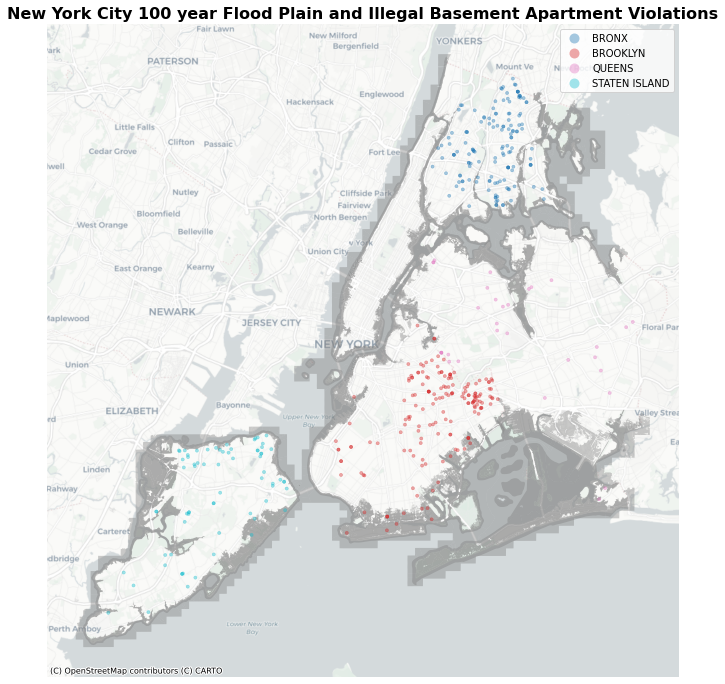

In [27]:
fig, ax = plt.subplots(figsize=(12,12))

flood.plot(ax=ax,
         lw=0.5,
         alpha=0.4,color='grey')
geocoded2.plot(ax=ax,
         lw=0.5,
         alpha=0.4,
        column='Borough',
        legend=True,
         markersize=10)
ax.set_title('New York City 100 year Flood Plain and Illegal Basement Apartment Violations',fontsize=16, weight='bold')

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

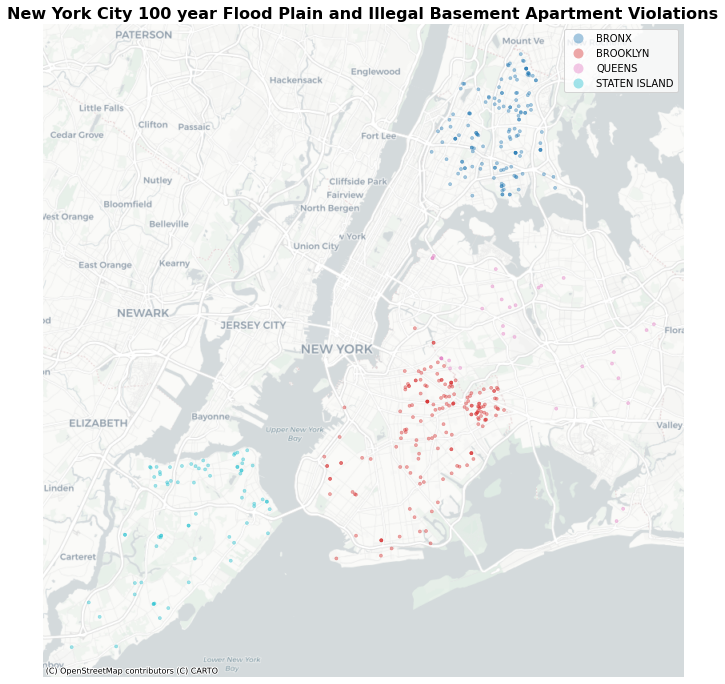

In [28]:
fig, ax = plt.subplots(figsize=(12,12))

geocoded2.plot(ax=ax,
         lw=0.5,
         alpha=0.4,
        column='Borough',
        legend=True,
         markersize=10)
ax.set_title('New York City 100 year Flood Plain and Illegal Basement Apartment Violations',fontsize=16, weight='bold')

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [29]:
race = gpd.read_file('data/NYC Race.geojson')

In [30]:
income = gpd.read_file('data/NYC Median Income.geojson')

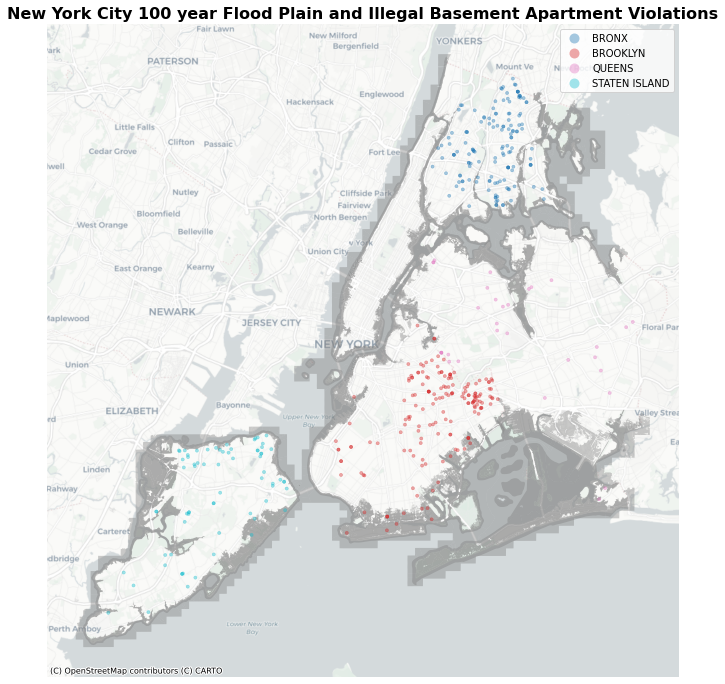

In [31]:
fig, ax = plt.subplots(figsize=(12,12))

flood.plot(ax=ax,
         lw=0.5,
         alpha=0.4,color='grey')
geocoded2.plot(ax=ax,
         lw=0.5,
         alpha=0.4,
        column='Borough',
        legend=True,
         markersize=10)
ax.set_title('New York City 100 year Flood Plain and Illegal Basement Apartment Violations',fontsize=16, weight='bold')

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [32]:
minx, miny, maxx, maxy = geocoded2.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-8263609.260710076
-8207928.30352336
4941515.589366299
4998228.316569231


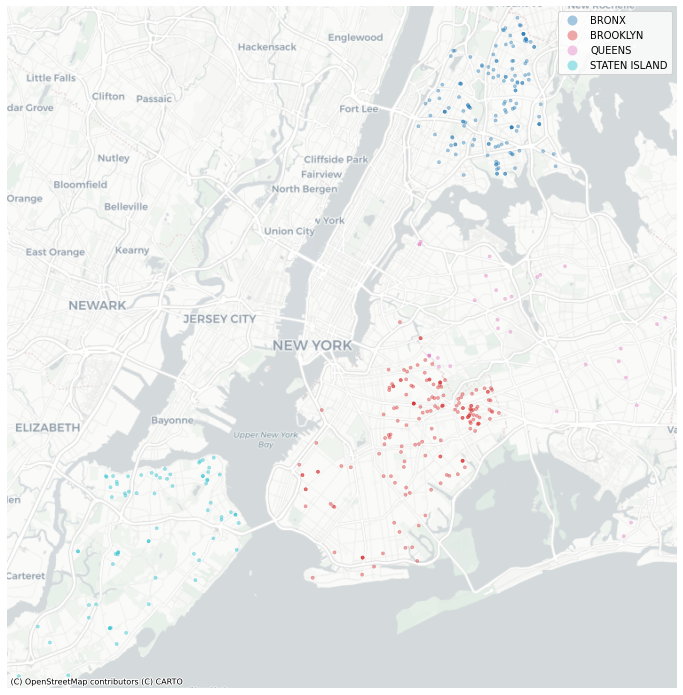

In [33]:
# set up the plot canvas with plt.subplots
fig, ax = plt.subplots(figsize=(12, 20))

# block groups
income.plot(ax=ax, # this puts it in the ax plot
        color='gray', 
        edgecolor='white',
        alpha=0.5)

# arrests
geocoded2.plot(ax=ax,
         lw=0.5,
         alpha=0.4,
        column='Borough',
        legend=True,
         markersize=10)

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx - 1000, maxx + 1000) # added/substracted value is to give some margin around total bounds
ax.set_ylim(miny - 1000, maxy + 1000)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

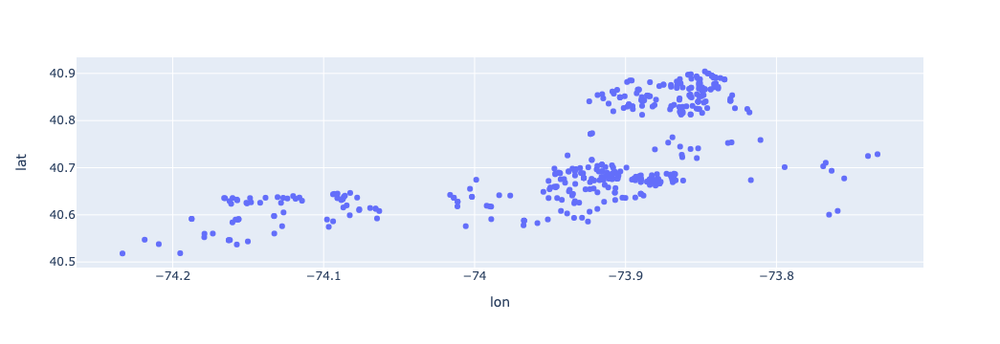

In [66]:
fig = px.scatter(geocoded2,
           x='lon',
           y='lat'
)

fig.show()

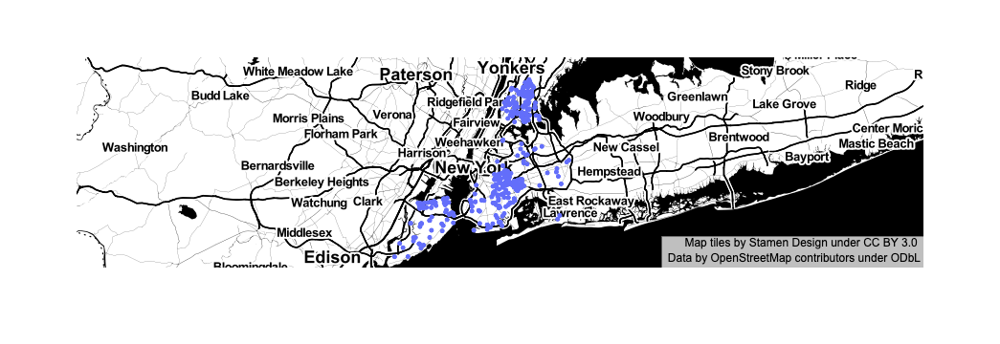

In [67]:
fig = px.scatter_mapbox(geocoded2,
                        lat='lat',
                        lon='lon',
                        mapbox_style="stamen-toner")
fig.show()

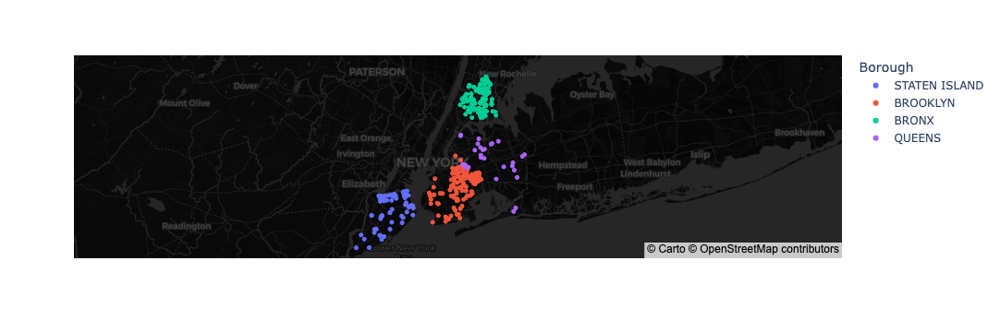

In [85]:
fig = px.scatter_mapbox(geocoded2, 
                        lat="lat", 
                        lon="lon",
                        color="Borough",
                        labels={'Borough':'Borough'}
                       )

fig.update_layout(mapbox_style="carto-darkmatter")

fig.show()

In [88]:
from keplergl import KeplerGl
map = KeplerGl(height=600, width=800, data={'Borough':geocoded2})
map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'Borough':      ViolationID  BuildingID  RegistrationID  BoroID        Borough  \
0       10033…

In [90]:
map.save_to_html(file_name='IllegalBasementViolations_kepler.html',read_only=True)

Map saved to IllegalBasementViolations_kepler.html!


In [34]:
gdf_tracts = gpd.read_file('data/NYC Tracts.geojson')

<AxesSubplot:>

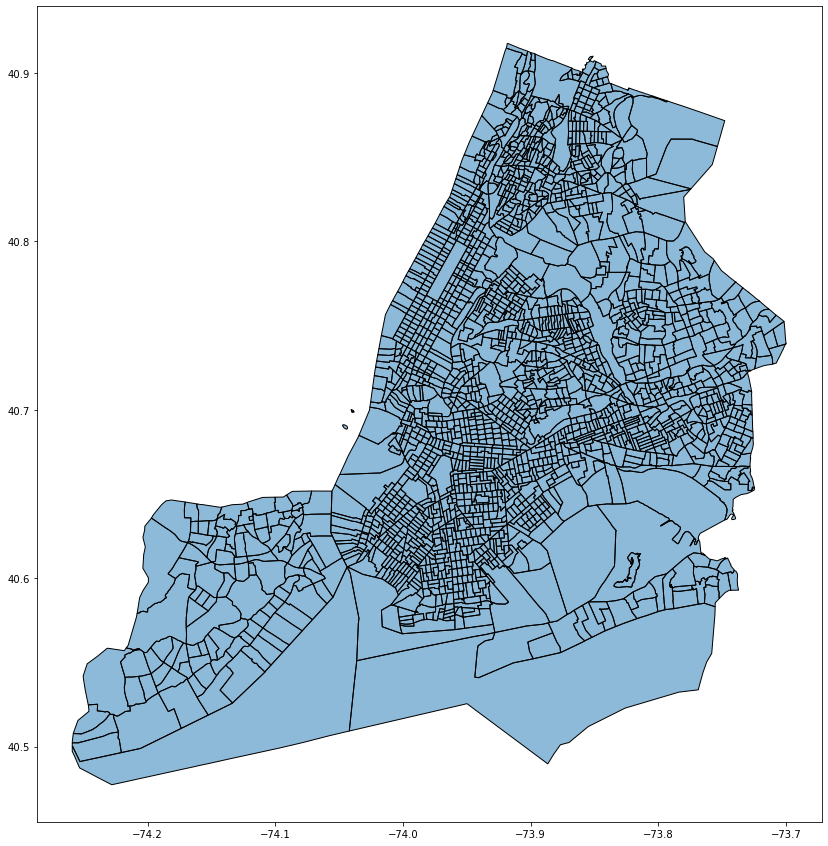

In [35]:
# compare
fig,ax = plt.subplots(figsize=(15,15))

# blue background of census tracts
gdf_tracts.plot(ax=ax,zorder=10,alpha=0.5)

# black boundary lines of census tracts on top of everything
gdf_tracts.boundary.plot(ax=ax,color='black',zorder=20,lw=1)

In [36]:
gdf_tracts.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2167 entries, 0 to 2166
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geoid             2167 non-null   object  
 1   name              2167 non-null   object  
 2   B01003001         2167 non-null   float64 
 3   B01003001, Error  2167 non-null   float64 
 4   geometry          2167 non-null   geometry
dtypes: float64(2), geometry(1), object(2)
memory usage: 84.8+ KB


In [37]:
gdf_tracts = gdf_tracts[['geoid','name','B01003001','geometry']]

In [38]:
gdf_tracts.columns = ['FIPS','Name','TotalPop','geometry']

In [39]:
gdf_tracts.tail()

,FIPS,Name,TotalPop,geometry
2162,14000US36085030302,"Census Tract 303.02, Richmond, NY",6702.0,"MULTIPOLYGON (((-74.16814 40.62208, -74.16793 ..."
2163,14000US36085031901,"Census Tract 319.01, Richmond, NY",2816.0,"MULTIPOLYGON (((-74.16647 40.62852, -74.16645 ..."
2164,14000US36085031902,"Census Tract 319.02, Richmond, NY",5343.0,"MULTIPOLYGON (((-74.17129 40.64052, -74.17118 ..."
2165,14000US36085032300,"Census Tract 323, Richmond, NY",1073.0,"MULTIPOLYGON (((-74.19709 40.63574, -74.19706 ..."
2166,14000US36085990100,"Census Tract 9901, Richmond, NY",0.0,"MULTIPOLYGON (((-74.25909 40.49956, -74.25909 ..."


In [40]:
gdf_tracts['FIPS'] = gdf_tracts['FIPS'].str.replace('14000US','')
gdf_tracts.tail()

/opt/conda/lib/python3.9/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


,FIPS,Name,TotalPop,geometry
2162,36085030302,"Census Tract 303.02, Richmond, NY",6702.0,"MULTIPOLYGON (((-74.16814 40.62208, -74.16793 ..."
2163,36085031901,"Census Tract 319.01, Richmond, NY",2816.0,"MULTIPOLYGON (((-74.16647 40.62852, -74.16645 ..."
2164,36085031902,"Census Tract 319.02, Richmond, NY",5343.0,"MULTIPOLYGON (((-74.17129 40.64052, -74.17118 ..."
2165,36085032300,"Census Tract 323, Richmond, NY",1073.0,"MULTIPOLYGON (((-74.19709 40.63574, -74.19706 ..."
2166,36085990100,"Census Tract 9901, Richmond, NY",0.0,"MULTIPOLYGON (((-74.25909 40.49956, -74.25909 ..."


In [41]:
gdf_tracts.sort_values(by='TotalPop').head(100)

,FIPS,Name,TotalPop,geometry
2166,36085990100,"Census Tract 9901, Richmond, NY",0.0,"MULTIPOLYGON (((-74.25909 40.49956, -74.25909 ..."
1954,36081099900,"Census Tract 999, Queens, NY",0.0,"MULTIPOLYGON (((-73.78332 40.79479, -73.78330 ..."
470,36047017500,"Census Tract 175, Kings, NY",0.0,"MULTIPOLYGON (((-74.00100 40.65407, -74.00041 ..."
103,36005017100,"Census Tract 171, Bronx, NY",0.0,"MULTIPOLYGON (((-73.90959 40.84275, -73.90955 ..."
1827,36081065501,"Census Tract 655.01, Queens, NY",0.0,"MULTIPOLYGON (((-73.87239 40.71783, -73.87143 ..."
...,...,...,...,...
1605,36081029300,"Census Tract 293, Queens, NY",1090.0,"MULTIPOLYGON (((-73.90247 40.75376, -73.90212 ..."
873,36047065200,"Census Tract 652, Kings, NY",1094.0,"MULTIPOLYGON (((-73.93321 40.61697, -73.93249 ..."
2101,36085013301,"Census Tract 133.01, Richmond, NY",1095.0,"MULTIPOLYGON (((-74.12064 40.63657, -74.11975 ..."
1789,36081060000,"Census Tract 600, Queens, NY",1102.0,"MULTIPOLYGON (((-73.73664 40.69404, -73.73576 ..."


In [42]:
gdf_tracts = gdf_tracts[gdf_tracts['TotalPop']>100]

In [43]:
gdf_tracts.sort_values(by='TotalPop').head(100)

,FIPS,Name,TotalPop,geometry
1201,36061010200,"Census Tract 102, New York, NY",122.0,"MULTIPOLYGON (((-73.97720 40.75854, -73.97674 ..."
7,36005002400,"Census Tract 24, Bronx, NY",155.0,"MULTIPOLYGON (((-73.88055 40.81847, -73.87977 ..."
1207,36061010900,"Census Tract 109, New York, NY",172.0,"MULTIPOLYGON (((-73.99298 40.75285, -73.99253 ..."
1195,36061009600,"Census Tract 96, New York, NY",177.0,"MULTIPOLYGON (((-73.98362 40.75552, -73.98317 ..."
15,36005003700,"Census Tract 37, Bronx, NY",250.0,"MULTIPOLYGON (((-73.91485 40.81099, -73.91447 ..."
...,...,...,...,...
1719,36081050202,"Census Tract 502.02, Queens, NY",1421.0,"MULTIPOLYGON (((-73.76255 40.71092, -73.76165 ..."
1705,36081048200,"Census Tract 482, Queens, NY",1427.0,"MULTIPOLYGON (((-73.77192 40.71569, -73.77110 ..."
1874,36081074900,"Census Tract 749, Queens, NY",1429.0,"MULTIPOLYGON (((-73.84436 40.71235, -73.84395 ..."
1804,36081062000,"Census Tract 620, Queens, NY",1431.0,"MULTIPOLYGON (((-73.74139 40.68186, -73.74090 ..."


In [44]:
gdf_tracts = gdf_tracts.to_crs(epsg=3857)

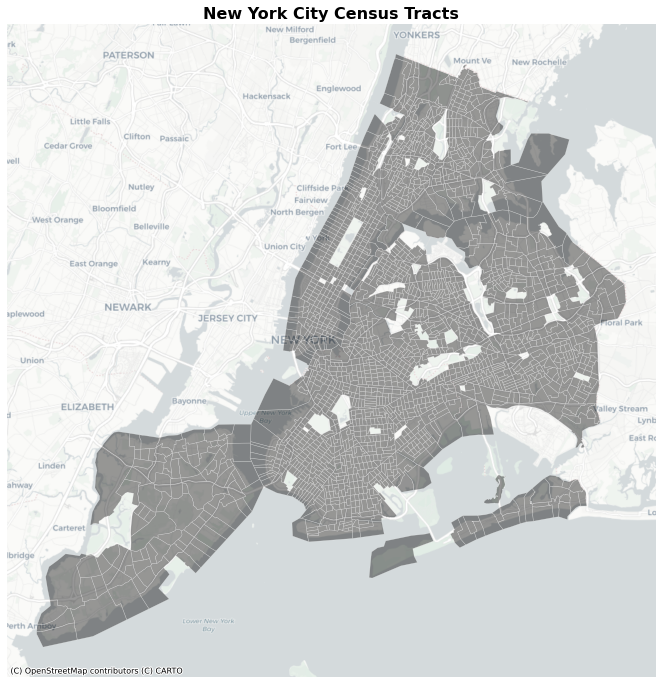

In [45]:
# plot it!
fig, ax = plt.subplots(figsize=(12,12))

gdf_tracts.plot(ax=ax,
         color='black', 
         edgecolor='white',
         lw=0.5,
         alpha=0.4)
ax.set_title('New York City Census Tracts',fontsize=16, weight='bold')
# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

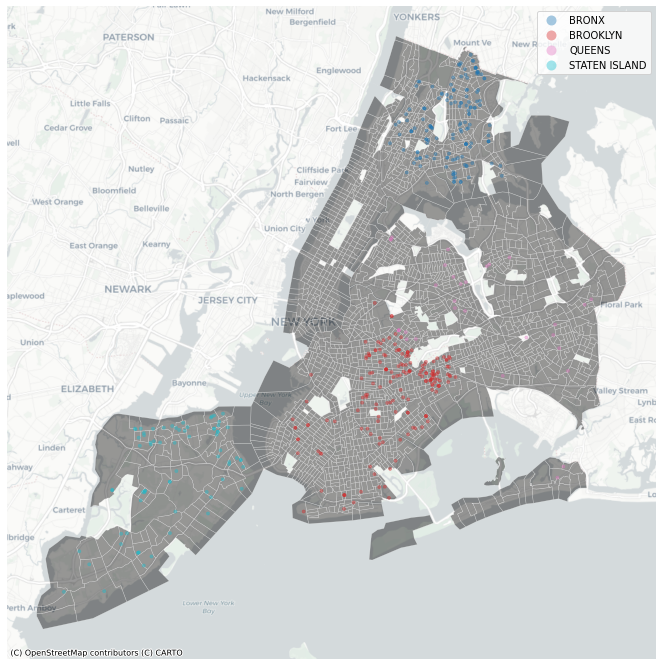

In [46]:
fig, ax = plt.subplots(figsize=(12,12))

gdf_tracts.plot(ax=ax,
         color='black', 
         edgecolor='white',
         lw=0.5,
         alpha=0.4)
geocoded2.plot(ax=ax,
         lw=0.5,
         alpha=0.4,
        column='Borough',
        legend=True,
         markersize=10)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [47]:
# get the bounding box coordinates for the arrest data
minx, miny, maxx, maxy = geocoded2.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-8263609.260710076
-8207928.30352336
4941515.589366299
4998228.316569231


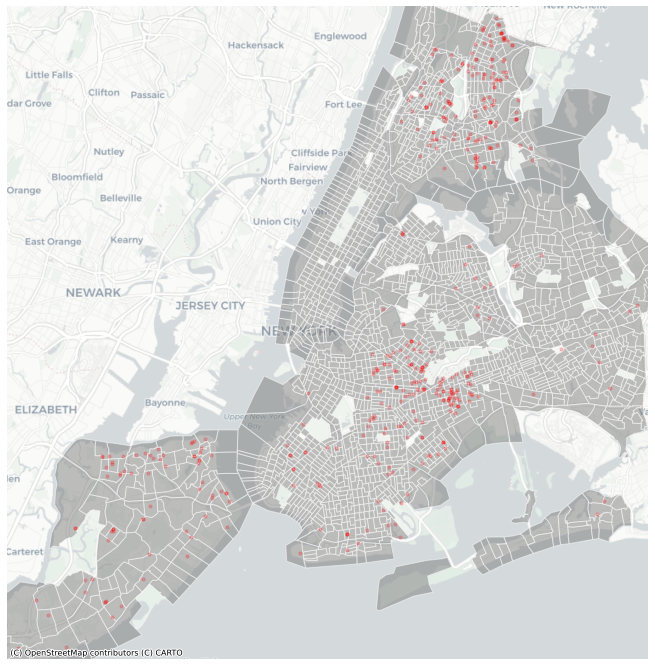

In [48]:
# set up the plot canvas with plt.subplots
fig, ax = plt.subplots(figsize=(12, 12))

# block groups
gdf_tracts.plot(ax=ax, # this puts it in the ax plot
        color='gray', 
        edgecolor='white',
        alpha=0.5)

# arrests
geocoded2.plot(ax=ax, # this also puts it in the same ax plot
            color='red',
            markersize=10,
            alpha=0.2)

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx - 1000, maxx + 1000) # added/substracted value is to give some margin around total bounds
ax.set_ylim(miny - 1000, maxy + 1000)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [49]:
join = gpd.sjoin(geocoded2, gdf_tracts, how='left')
join.head()

,ViolationID,BuildingID,RegistrationID,BoroID,Borough,City,State,Address,Story,Block,Lot,lat,lon,geometry,index_right,FIPS,Name,TotalPop
0,10033903,757006,0,5,STATEN ISLAND,Staten Island,NY,"61 LUDLOW STREET, STATEN ISLAND, NY 10312",Cellar,5665,12,40.552502,-74.179096,POINT (-8257579.234 4946558.148),2120.0,36085017008,"Census Tract 170.08, Richmond, NY",7795.0
1,10395188,292273,820243,3,BROOKLYN,Brooklyn,NY,"1434 FLATBUSH AVENUE, BROOKLYN, NY 11210",Cellar,5249,46,40.635634,-73.950999,POINT (-8232187.532 4958745.401),924.0,36047077000,"Census Tract 770, Kings, NY",2820.0
4,11031926,110779,714099,2,BRONX,Bronx,NY,"409 ST LAWRENCE AVENUE, BRONX, NY 10473",Cellar,3493,72,40.813045,-73.863197,POINT (-8222413.439 4984804.764),1.0,36005000200,"Census Tract 2, Bronx, NY",4532.0
5,11363380,836050,821239,3,BROOKLYN,Brooklyn,NY,"414A KOSCIUSZKO STREET, BROOKLYN, NY 11221",Basement,1605,29,40.692025,-73.937699,POINT (-8230707.031 4967021.018),571.0,36047028100,"Census Tract 281, Kings, NY",4764.0
6,11586192,295305,0,3,BROOKLYN,Brooklyn,NY,"9508 FOSTER AVENUE, BROOKLYN, NY 11236",Basement,8145,29,40.647184,-73.907048,POINT (-8227294.940 4960439.860),1016.0,36047097000,"Census Tract 970, Kings, NY",2868.0


In [50]:
geocoded_by_gdf_tracts = join.FIPS.value_counts().rename_axis('FIPS').reset_index(name='Address')

In [51]:
geocoded_by_gdf_tracts.head()

,FIPS,Address
0,36005042600,6
1,36047119800,4
2,36047040900,4
3,36085013302,4
4,36005002000,4


<AxesSubplot:xlabel='FIPS'>

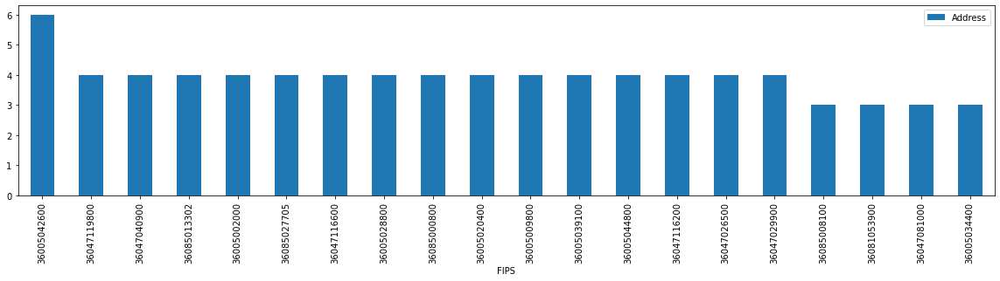

In [52]:
# make a bar chart of top 20 geographies
geocoded_by_gdf_tracts[:20].plot.bar(figsize=(20,4),
                             x='FIPS',
                             y='Address')

In [53]:
gdf_tracts=gdf_tracts.merge(geocoded_by_gdf_tracts,on='FIPS')

In [54]:
gdf_tracts.head()

,FIPS,Name,TotalPop,geometry,Address
0,36005000200,"Census Tract 2, Bronx, NY",4532.0,"MULTIPOLYGON (((-8222638.455 4985023.105, -822...",2
1,36005000400,"Census Tract 4, Bronx, NY",5516.0,"MULTIPOLYGON (((-8222012.728 4985134.009, -822...",2
2,36005001600,"Census Tract 16, Bronx, NY",5825.0,"MULTIPOLYGON (((-8222331.881 4985717.084, -822...",1
3,36005002000,"Census Tract 20, Bronx, NY",9040.0,"MULTIPOLYGON (((-8223226.556 4985881.393, -822...",4
4,36005003800,"Census Tract 38, Bronx, NY",1350.0,"MULTIPOLYGON (((-8222595.374 4985995.396, -822...",1


In [55]:
gdf_tracts['address_per_1000'] = gdf_tracts['Address']/gdf_tracts['TotalPop']*1000

In [56]:
gdf_tracts.sort_values(by="address_per_1000").tail()

,FIPS,Name,TotalPop,geometry,Address,address_per_1000
46,36005031600,"Census Tract 316, Bronx, NY",1900.0,"MULTIPOLYGON (((-8220972.225 4991685.904, -822...",3,1.578947
184,36047116200,"Census Tract 1162, Kings, NY",2429.0,"MULTIPOLYGON (((-8225095.388 4964059.148, -822...",4,1.646768
173,36047101600,"Census Tract 1016, Kings, NY",1715.0,"MULTIPOLYGON (((-8225510.832 4960008.653, -822...",3,1.749271
83,36005044800,"Census Tract 448, Bronx, NY",2075.0,"MULTIPOLYGON (((-8220294.846 4997145.721, -822...",4,1.927711
117,36047036700,"Census Tract 367, Kings, NY",1281.0,"MULTIPOLYGON (((-8227398.143 4964868.626, -822...",3,2.341920


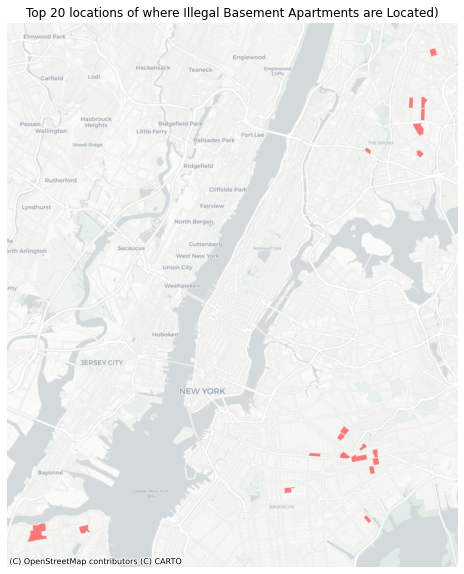

In [57]:
# map the top 20 geographies
fig,ax = plt.subplots(figsize=(12,10))
gdf_tracts.sort_values(by='address_per_1000',ascending=False)[:20].plot(ax=ax,
                                                                 color='red',
                                                                 edgecolor='white',
                                                                 alpha=0.5,legend=True)


# title
ax.set_title('Top 20 locations of where Illegal Basement Apartments are Located)')

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

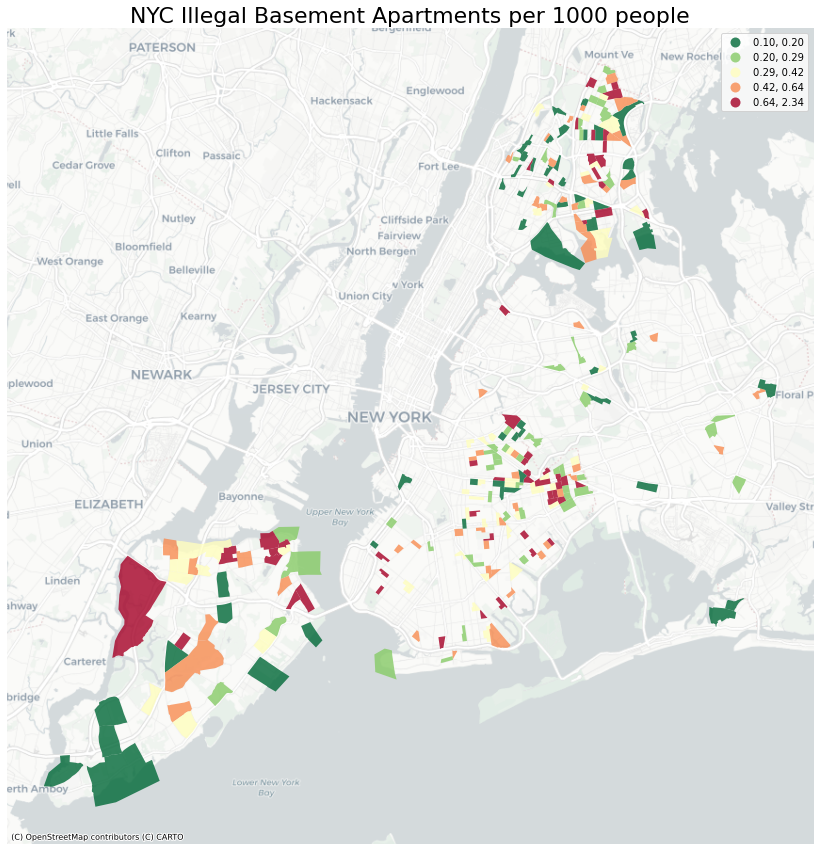

In [58]:
fig,ax = plt.subplots(figsize=(15,15))

gdf_tracts.plot(ax=ax,
        column='address_per_1000',
        legend=True,
        alpha=0.8,
        cmap='RdYlGn_r',
        scheme='quantiles')

ax.axis('off')
ax.set_title('NYC Illegal Basement Apartments per 1000 people',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [59]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(gdf_tracts,k=8)

# Row-standardization
wq.transform = 'r'

In [60]:
gdf_tracts['address_per_1000_lag'] = lps.weights.lag_spatial(wq, gdf_tracts['address_per_1000'])

In [61]:
gdf_tracts.sample(10)[['FIPS','TotalPop','Address','address_per_1000','address_per_1000_lag']]

,FIPS,TotalPop,Address,address_per_1000,address_per_1000_lag
24,36005017702,5423.0,1,0.184400,0.391200
32,36005023800,2241.0,1,0.446229,0.538191
112,36047035100,4650.0,1,0.215054,0.386559
252,36085020801,8498.0,1,0.117675,0.274919
170,36047099600,3761.0,1,0.265887,0.670215
20,36005013200,7272.0,1,0.137514,0.432564
173,36047101600,1715.0,3,1.749271,0.450562
123,36047038900,2837.0,1,0.352485,0.324291
162,36047087200,3130.0,1,0.319489,0.521496
31,36005023502,4153.0,3,0.722369,0.214589


In [62]:
gdf_tracts['address_lag_diff'] = gdf_tracts['address_per_1000'] - gdf_tracts['address_per_1000_lag']

In [63]:
gdf_tracts.sort_values(by='address_lag_diff')

,FIPS,Name,TotalPop,geometry,Address,address_per_1000,address_per_1000_lag,address_lag_diff
196,36047119400,"Census Tract 1194, Kings, NY",4892.0,"MULTIPOLYGON (((-8224270.844 4964412.433, -822...",1,0.204415,0.843403,-0.638988
181,36047114600,"Census Tract 1146, Kings, NY",2852.0,"MULTIPOLYGON (((-8226124.870 4965049.318, -822...",1,0.350631,0.967888,-0.617257
50,36005034800,"Census Tract 348, Bronx, NY",5707.0,"MULTIPOLYGON (((-8221673.649 4993631.618, -822...",1,0.175223,0.775593,-0.600370
118,36047036900,"Census Tract 369, Kings, NY",5787.0,"MULTIPOLYGON (((-8227825.387 4965722.503, -822...",1,0.172801,0.732983,-0.560182
182,36047115000,"Census Tract 1150, Kings, NY",2557.0,"MULTIPOLYGON (((-8225302.664 4964594.584, -822...",1,0.391083,0.926999,-0.535916
...,...,...,...,...,...,...,...,...
184,36047116200,"Census Tract 1162, Kings, NY",2429.0,"MULTIPOLYGON (((-8225095.388 4964059.148, -822...",4,1.646768,0.653469,0.993300
102,36047029900,"Census Tract 299, Kings, NY",2941.0,"MULTIPOLYGON (((-8229885.799 4964895.193, -822...",4,1.360082,0.302378,1.057703
173,36047101600,"Census Tract 1016, Kings, NY",1715.0,"MULTIPOLYGON (((-8225510.832 4960008.653, -822...",3,1.749271,0.450562,1.298709
83,36005044800,"Census Tract 448, Bronx, NY",2075.0,"MULTIPOLYGON (((-8220294.846 4997145.721, -822...",4,1.927711,0.475073,1.452638


In [64]:
gdf_tracts_donut = gdf_tracts.sort_values(by='address_lag_diff').head(1)
gdf_tracts_donut

,FIPS,Name,TotalPop,geometry,Address,address_per_1000,address_per_1000_lag,address_lag_diff
196,36047119400,"Census Tract 1194, Kings, NY",4892.0,"MULTIPOLYGON (((-8224270.844 4964412.433, -822...",1,0.204415,0.843403,-0.638988


In [65]:
gdf_tracts_diamond = gdf_tracts.sort_values(by='address_lag_diff').tail(1)
gdf_tracts_diamond

,FIPS,Name,TotalPop,geometry,Address,address_per_1000,address_per_1000_lag,address_lag_diff
117,36047036700,"Census Tract 367, Kings, NY",1281.0,"MULTIPOLYGON (((-8227398.143 4964868.626, -822...",3,2.34192,0.491735,1.850186


In [66]:
token = 'pk.eyJ1Ijoiam1lbDIxIiwiYSI6ImNrd3BwaHFndzBmMTEycXMyazZjM2J5czAifQ.EDDFydrpo4DMAzpYOceYLw'
px.set_mapbox_access_token(token)

In [67]:
# subset donut, project to WGS84, and get its centroid
gdf_tracts_donut = gdf_tracts_donut.to_crs('epsg:4326')

# what's the centroid?
minx, miny, maxx, maxy = gdf_tracts_donut.geometry.total_bounds
center_lat_donut = (maxy-miny)/2+miny
center_lon_donut = (maxx-minx)/2+minx

In [68]:
# subset diamond, project to WGS84, and get its centroid
gdf_tracts_diamond = gdf_tracts_diamond.to_crs('epsg:4326')

# what's the centroid?
minx, miny, maxx, maxy = gdf_tracts_diamond.geometry.total_bounds
center_lat_diamond = (maxy-miny)/2+miny
center_lon_diamond = (maxx-minx)/2+minx

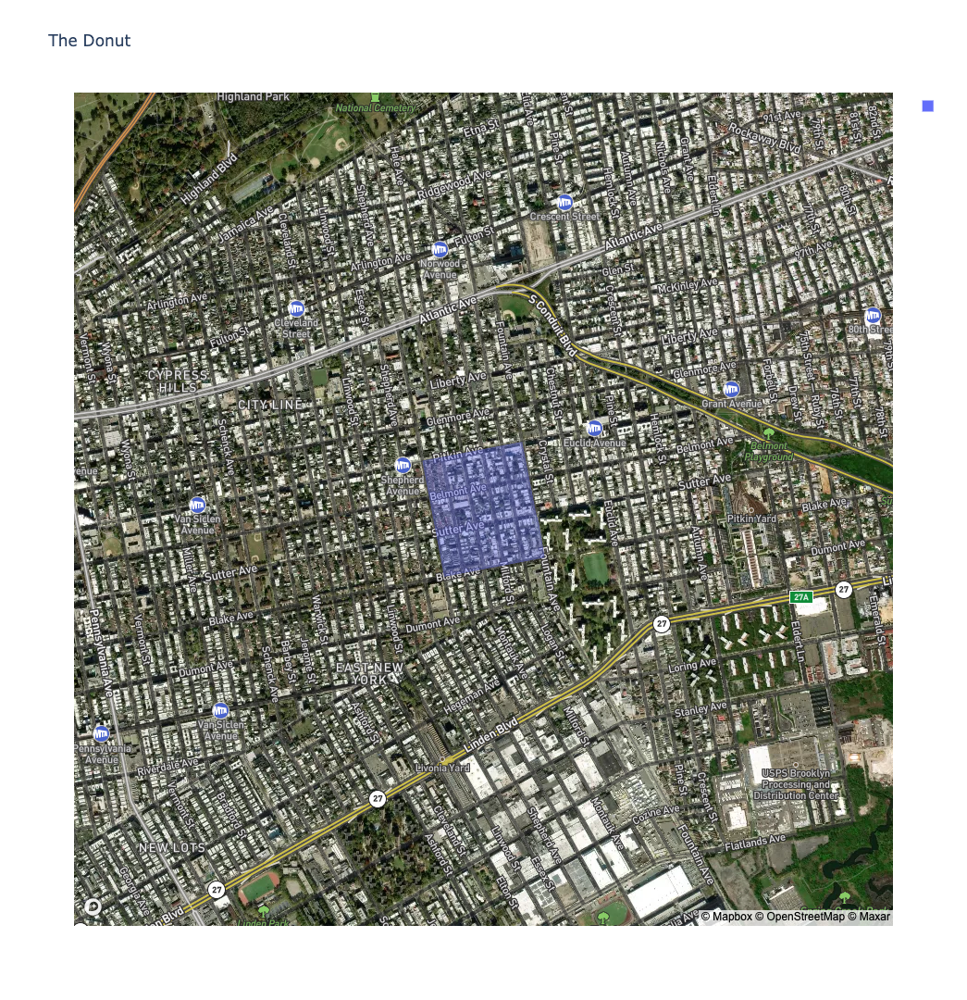

In [69]:
px.choropleth_mapbox(gdf_tracts_donut, 
                     geojson=gdf_tracts_donut.geometry, 
                     locations=gdf_tracts_donut.index, 
                     mapbox_style="satellite-streets",
                     zoom=14, 
                     center = {"lat": center_lat_donut, "lon": center_lon_donut},
                     hover_data=['FIPS','TotalPop','Address','address_per_1000','address_per_1000_lag'],
                     opacity=0.4,
                     title='The Donut')

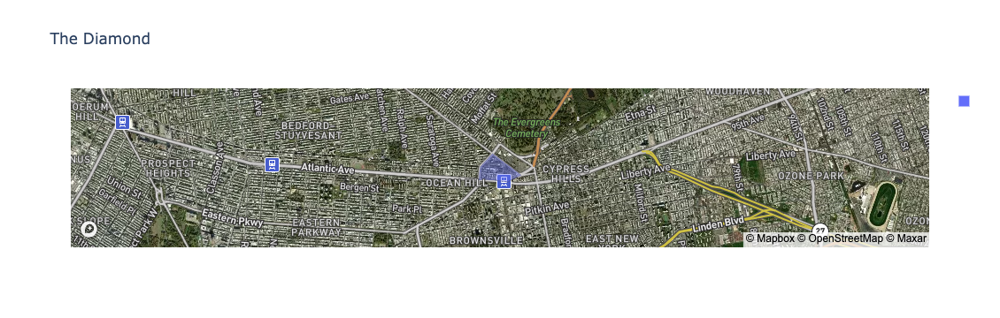

In [70]:
px.choropleth_mapbox(gdf_tracts_diamond, 
                     geojson=gdf_tracts_diamond.geometry, 
                     locations=gdf_tracts_diamond.index, 
                     mapbox_style="satellite-streets",
                     zoom=12, 
                     center = {"lat": center_lat_diamond, "lon": center_lon_diamond},
                     hover_data=['FIPS','TotalPop','Address','address_per_1000','address_per_1000_lag'],
                     opacity=0.4,
                     title='The Diamond')

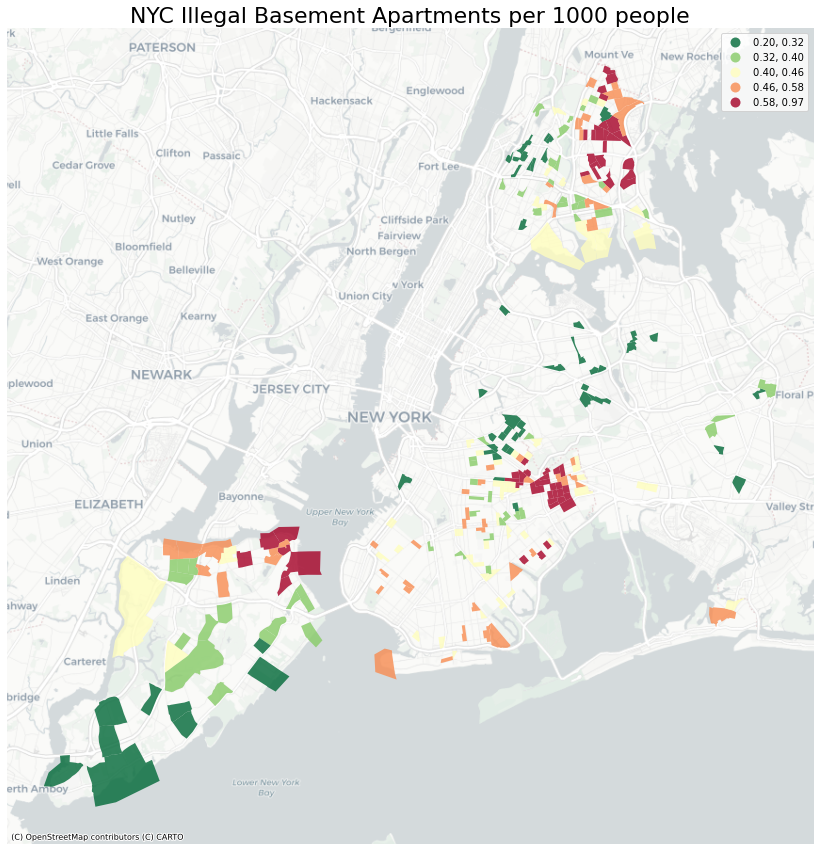

In [71]:
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
gdf_tracts.plot(ax=ax,
         figsize=(15,15),
         column='address_per_1000_lag',
         legend=True,
         alpha=0.8,
         cmap='RdYlGn_r',
         scheme='quantiles')

ax.axis('off')
ax.set_title('NYC Illegal Basement Apartments per 1000 people',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

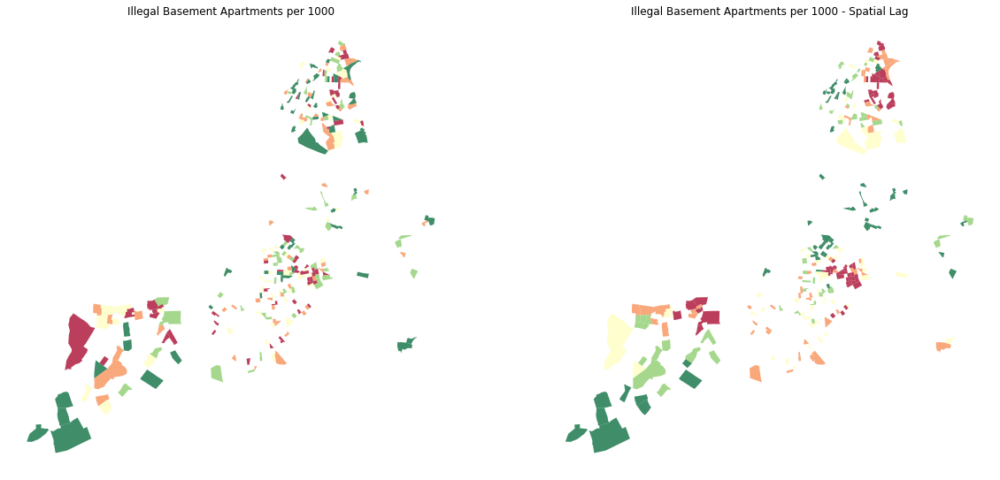

In [72]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

# two subplots produces ax[0] (left) and ax[1] (right)

# regular count map on the left
gdf_tracts.plot(ax=ax[0], # this assigns the map to the left subplot
         column='address_per_1000', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75, 
           )


ax[0].axis("off")
ax[0].set_title("Illegal Basement Apartments per 1000")

# spatial lag map on the right
gdf_tracts.plot(ax=ax[1], # this assigns the map to the right subplot
         column='address_per_1000_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75
           )

ax[1].axis("off")
ax[1].set_title("Illegal Basement Apartments per 1000 - Spatial Lag")

plt.show()

In [73]:
y = gdf_tracts.address_per_1000
moran = Moran(y, wq)
moran.I

0.09376207415389501

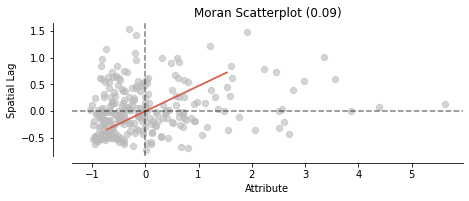

In [74]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

(<Figure size 504x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Reference Distribution'}, xlabel='Moran I: 0.09', ylabel='Density'>)

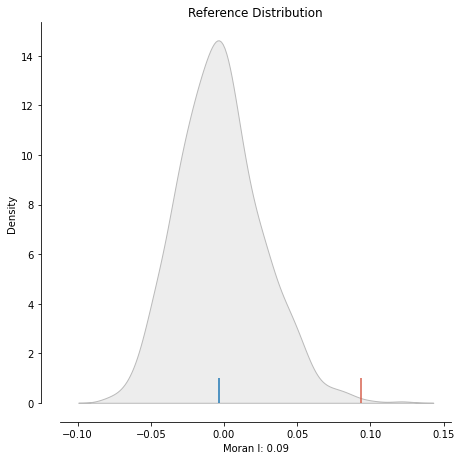

In [75]:
plot_moran_simulation(moran,aspect_equal=False)

In [76]:
moran.p_sim

0.003

In [77]:
lisa = esda.moran.Moran_Local(y, wq)

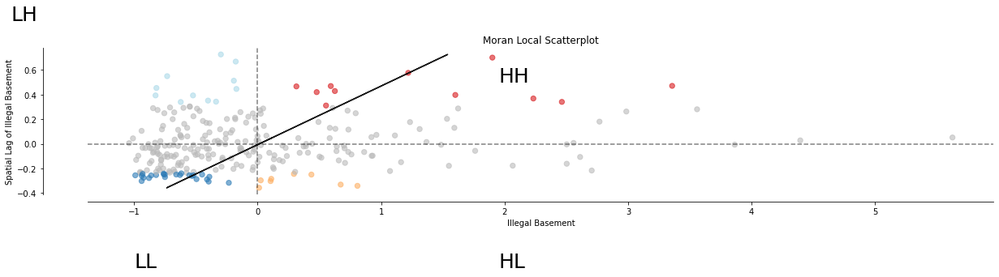

In [78]:
fig,ax = plt.subplots(figsize=(20,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Illegal Basement")
ax.set_ylabel('Spatial Lag of Illegal Basement')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

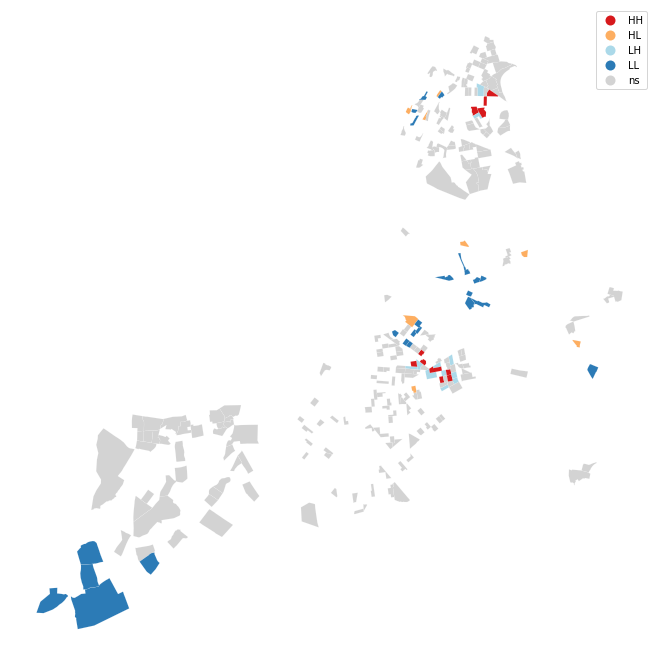

In [79]:
fig, ax = plt.subplots(figsize=(14,12))
lisa_cluster(lisa, gdf_tracts, p=0.05, ax=ax)
plt.show()

In [80]:
gdf_web = gdf_tracts.to_crs('EPSG:4326')

In [81]:
gdf_web.address_per_1000_lag.describe()

count    267.000000
mean       0.455227
std        0.149533
min        0.203435
25%        0.345905
50%        0.431457
75%        0.538532
max        0.967888
Name: address_per_1000_lag, dtype: float64

In [82]:
minx, miny, maxx, maxy = gdf_web.geometry.total_bounds
center_lat_gdf_web = (maxy-miny)/2+miny
center_lon_gdf_web = (maxx-minx)/2+minx

In [83]:
median = gdf_web.address_per_1000_lag.median()

In [84]:
median

0.43145652430414133